In [1]:
# import libraries here; add more as necessary
import numpy as np
import pandas as pd
from time import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
# Import train_test_split
from sklearn.cross_validation import train_test_split
from collections import defaultdict
from wordcloud import WordCloud


# magic word for producing visualizations in notebook
%matplotlib inline

C:\Users\Akshat\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



# Business and Data Understanding

    What is the data like?
    How many numerical and string dtypes do we have?
    What is the corelation between Installs, reviews, price, free and paid apps?
    What are the categorical data?

In [2]:
df_playstore = pd.read_csv('googleplaystore.csv',delimiter=',')
df_reviews = pd.read_csv('googleplaystore_user_reviews.csv',delimiter=',')
df_playstore.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [3]:
print (df_playstore.shape)
print (df_playstore.info())
print (df_playstore.columns)

(10841, 13)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
App               10841 non-null object
Category          10841 non-null object
Rating            9367 non-null float64
Reviews           10841 non-null object
Size              10841 non-null object
Installs          10841 non-null object
Type              10840 non-null object
Price             10841 non-null object
Content Rating    10840 non-null object
Genres            10841 non-null object
Last Updated      10841 non-null object
Current Ver       10833 non-null object
Android Ver       10838 non-null object
dtypes: float64(1), object(12)
memory usage: 1.1+ MB
None
Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver',
       'Android Ver'],
      dtype='object')


#    Data Understanding
    Find unique values and counts of it per column to analyze the data preparation tasks ahead. Find which kinds of values are found and dtypes of each column. 

In [4]:
for col in df_playstore.columns:
    print (df_playstore[col].value_counts())

ROBLOX                                                9
CBS Sports App - Scores, News, Stats & Watch Live     8
8 Ball Pool                                           7
Duolingo: Learn Languages Free                        7
Candy Crush Saga                                      7
ESPN                                                  7
Bleacher Report: sports news, scores, & highlights    6
Nick                                                  6
Zombie Catchers                                       6
Temple Run 2                                          6
Sniper 3D Gun Shooter: Free Shooting Games - FPS      6
Subway Surfers                                        6
Helix Jump                                            6
Bowmasters                                            6
slither.io                                            6
Bubble Shooter                                        6
Viber Messenger                                       5
Calorie Counter - MyFitnessPal                  

In [5]:
df_reviews.head()

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000


# Prepare and clean Data

    Define -
        Data cleaning steps- df_playstore
        1. Drop duplicates in 'App' column googleplaystore
        2. Remove "M" & "k" from Size column. Convert value to MB and dtype to float."Varies with device" would be NaN. Replace 1,000+ with 1.
        3. Remove "+" from Installs column. Convert to int.
        4. Remove single row in playstore dataframe where Category = 1.9.
        5. Replace zero 0 with Free in column Type. Convert to float
        6. Remove $ sign from Price column and convert to float
        7. Genres - split on ; keep second but remove the first part
        8. Last Updated - change dtype to datetime and time 
        9. Current Ver - do nothing as of now.
        Android Ver - split and remove " and up" string... If time allows.!![image.png](attachment:image.png)

In [6]:
df_playstore.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver',
       'Android Ver'],
      dtype='object')

In [7]:
# Clean data for App column
df_playstore.drop_duplicates(['App'],keep='first',inplace=True)

In [8]:
# Drop row from Category column where df_playstore['Category'] == '1.9'
#Convert the index value to list then pass it to drop function.
df_playstore.drop(list(df_playstore.loc[df_playstore['Category'] == '1.9'].index),axis=0,inplace=True)

In [9]:
# Clean data for Size column
df_playstore['Size'].replace('Varies with device',np.nan,inplace=True)
df_playstore['Size'] = df_playstore['Size'].map(lambda x: str(x)[:-1] if 'M' in str(x) else x)
df_playstore['Size'] = df_playstore['Size'].map(lambda x: str(x)[:-1] if '+' in str(x) else x)
df_playstore['Size'] = df_playstore['Size'].apply(lambda x: float(str(x).replace('k', '')) / 1000 if 'k' in str(x) else x)
df_playstore['Size'].replace('1,000','1',inplace=True)
df_playstore['Size'] = df_playstore['Size'].astype('float')
df_playstore['Size'].dtype

dtype('float64')

In [10]:
# Clean data for Installs column
df_playstore['Installs'] = df_playstore['Installs'].map(lambda x: str(x)[:-1] if '+' in str(x) else x)
df_playstore['Installs'] = df_playstore['Installs'].map(lambda x : str(x).replace(',','') if ',' in str(x) else x)
df_playstore['Installs'].replace('Free','0',inplace=True)
df_playstore['Installs'] = df_playstore['Installs'].astype('int')
df_playstore['Installs'].dtype

dtype('int32')

In [11]:
# Clean data for Ratings column
df_playstore['Rating'] = df_playstore['Rating'].astype('float')

In [12]:
# Change dtype for Reviews column
df_playstore['Reviews'] = df_playstore['Reviews'].astype('int')
df_playstore['Reviews'].dtype

dtype('int32')

In [13]:
#Data cleaning and wrangling for Price column
df_playstore['Price'] = df_playstore['Price'].map(lambda x : str(x).replace('$','') if '$' in str(x) else x)
df_playstore.rename(columns={'Price':'Price_in_dollars'},inplace=True)
df_playstore['Price_in_dollars'] = df_playstore['Price_in_dollars'].astype('float')
print(df_playstore['Price_in_dollars'].dtype)

float64


In [14]:
#Split values of Genres columns by ';' and group appropriatly
print (df_playstore['Genres'].shape)
df_playstore['Genres'] = df_playstore['Genres'].map(lambda x : str(x).rsplit(';')[0] if ';' in str(x) else x)
print (df_playstore['Genres'].shape[0])
print (df_playstore['Genres'].dtype)

(9659,)
9659
object


In [15]:
# Change dtype of Last Updated to date time.
df_playstore['Last Updated'] = pd.to_datetime(df_playstore['Last Updated'],dayfirst=True)

#    Data preparing - removing NaNs and missing values from the dataset.
        1. Find and replace missing values columnwise
        2. Find and replace missing values rowwise.

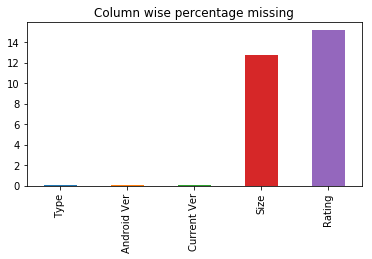

In [16]:
#Find and visualize missing values columnwise.
missing_data = df_playstore.isnull().sum()
missing_data = (missing_data[missing_data>0]/df_playstore.shape[0]) * 100
missing_data.sort_values(inplace=True)
missing_data.plot.bar(title = 'Column wise percentage missing', figsize=(6,3))

In [17]:
#Fill NaN values with mean of respective columns. Nan values are replaced with respective mean values because it would 
#introduce minimum bias in the data.

#np.where(np.isnan(df_playstore))
df_playstore['Rating'].fillna(df_playstore['Rating'].mean(),inplace=True)
df_playstore['Size'].fillna(df_playstore['Size'].mean(),inplace=True)

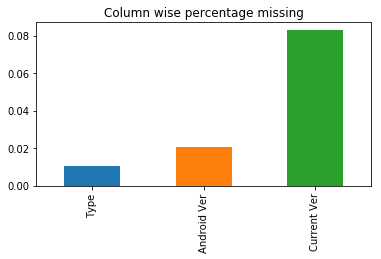

In [18]:
#Plot after replacing Nan values with respective mean() values of that column. 
missing_data = df_playstore.isnull().sum()
missing_data = (missing_data[missing_data>0]/df_playstore.shape[0]) * 100
missing_data.sort_values(inplace=True)
missing_data.plot.bar(title = 'Column wise percentage missing', figsize=(6,3))

    In the above chart there are three columns - Type, Android Version and Current Version which still has NaN or missing values  but it would not be replaced with any values because I would not use these columns for modelling or analysis purposes. I shall drop these columns from my analysis dataset.
    
    Type column would be one hot encoded later in the stage.

In [19]:
df_playstore.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price_in_dollars,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0,10000,Free,0.0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0,500000,Free,0.0,Everyone,Art & Design,2018-01-15,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7,5000000,Free,0.0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0,50000000,Free,0.0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8,100000,Free,0.0,Everyone,Art & Design,2018-06-20,1.1,4.4 and up


App                    Kingdom in Chaos
Category                         FAMILY
Rating                              4.3
Reviews                            5623
Size                                 28
Installs                         100000
Type                               Free
Price_in_dollars                      0
Content Rating             Everyone 10+
Genres                     Role Playing
Last Updated        2015-12-21 00:00:00
Current Ver                       1.0.5
Android Ver                  2.3 and up
Name: 8419, dtype: object


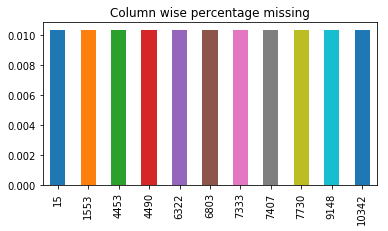

In [20]:
#find and drop rows (axis=1) with missing values
missing_data = df_playstore.isnull().sum(axis=1)
missing_data = (missing_data[missing_data>0]/df_playstore.shape[0]) * 100
missing_data.sort_values(inplace=True)
missing_data.plot.bar(title = 'Column wise percentage missing', figsize=(6,3))
print (df_playstore.iloc[7333])

       In above step, I have not deleted  rows with missing values as the  rows still have important information for many columns. All numeric columns do have missing values. I would handle NAN values during scaling and modelling if I face any errors. 

# Data Understanding-

    Once the data is cleaned and usable, plot scatter and bar chart to visualize data. Data understanding is combined with data cleaning preparing activities before putting it for scaling and modelling. 

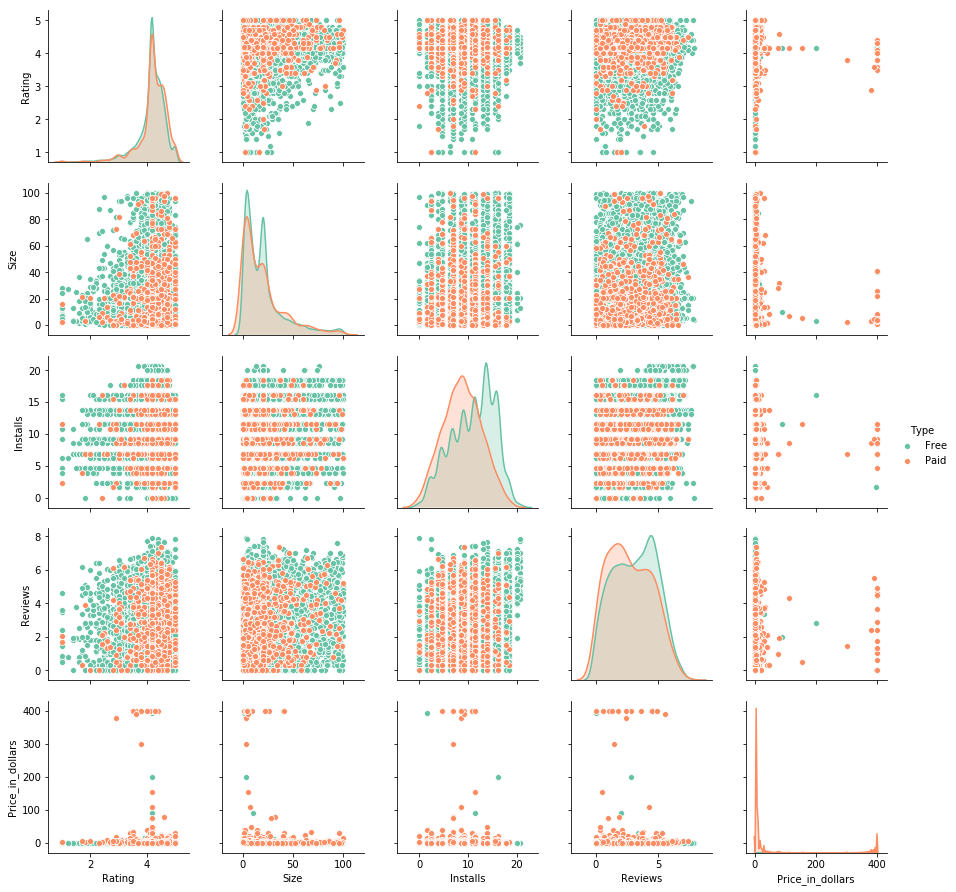

In [21]:
#Scatterplot Matrix from seaborn
x = df_playstore['Rating'].dropna()
y = df_playstore['Size'].dropna()
z = df_playstore['Installs'][df_playstore.Installs!=0].dropna()
p = df_playstore['Reviews'][df_playstore.Reviews!=0].dropna()
t = df_playstore['Type'].dropna()
price = df_playstore['Price_in_dollars']

p = sns.pairplot(pd.DataFrame(list(zip(x, y, np.log(z), np.log10(p), t, price)), 
                        columns=['Rating','Size', 'Installs', 'Reviews', 'Type', 'Price_in_dollars']), hue='Type', palette="Set2")

# Data Understanding
    Plot categorical column 'Category' to visualize number of Apps available per category in the dataset. This chart would find its place in the blog.

33


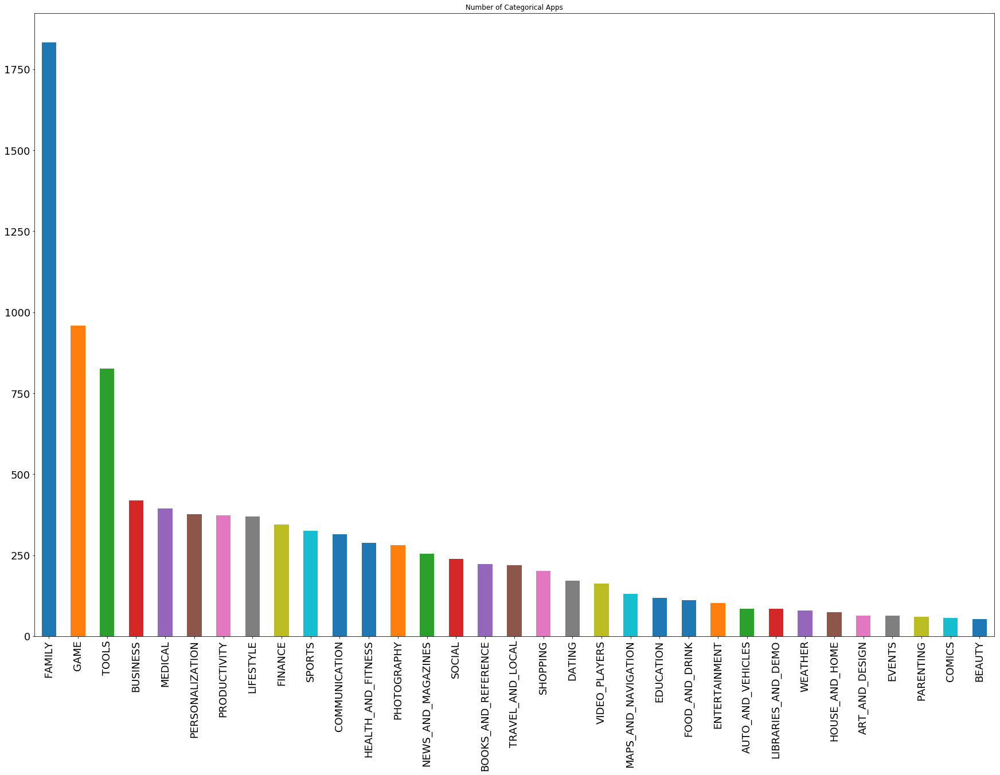

In [22]:
print (len(df_playstore['Category'].value_counts()))
df_playstore['Category'].value_counts().plot.bar(title = 'Number of Categorical Apps', figsize=(30,20),fontsize=18)

# Data Preparing - 

    Data Preprocessing- One hot encode and Label encode the categorical columns. Then scale down all numerical columns using standard scaler function.
    Using getdummies on 'Type' column would add 0s and 1s values in two columns which would into add a lot of bias. After scaling, the values would still easily be between 0 and 1. This is a simple categorical column and do not have lots of labels so getdummies is best suitable here.
    
    Using Label encoding on Category column would mark all 33 different columns with unique ids. This would add some bias though but scaling should normalize the values. It would be interesting to see how Linear Regression model weighs on Category column.
    
    Columns like Genres and versions are not useful for modelling hence I would drop them before scaling later.
    
    Reference links- https://machinelearningmastery.com/how-to-one-hot-encode-sequence-data-in-python/
    https://stackoverflow.com/questions/24458645/label-encoding-across-multiple-columns-in-scikit-learn

In [23]:
Categories = df_playstore['Category'].unique()
Categories

array(['ART_AND_DESIGN', 'AUTO_AND_VEHICLES', 'BEAUTY',
       'BOOKS_AND_REFERENCE', 'BUSINESS', 'COMICS', 'COMMUNICATION',
       'DATING', 'EDUCATION', 'ENTERTAINMENT', 'EVENTS', 'FINANCE',
       'FOOD_AND_DRINK', 'HEALTH_AND_FITNESS', 'HOUSE_AND_HOME',
       'LIBRARIES_AND_DEMO', 'LIFESTYLE', 'GAME', 'FAMILY', 'MEDICAL',
       'SOCIAL', 'SHOPPING', 'PHOTOGRAPHY', 'SPORTS', 'TRAVEL_AND_LOCAL',
       'TOOLS', 'PERSONALIZATION', 'PRODUCTIVITY', 'PARENTING', 'WEATHER',
       'VIDEO_PLAYERS', 'NEWS_AND_MAGAZINES', 'MAPS_AND_NAVIGATION'],
      dtype=object)

In [24]:
df_playstore.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price_in_dollars,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0,10000,Free,0.0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0,500000,Free,0.0,Everyone,Art & Design,2018-01-15,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7,5000000,Free,0.0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0,50000000,Free,0.0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8,100000,Free,0.0,Everyone,Art & Design,2018-06-20,1.1,4.4 and up


In [25]:
# getdummies encoding for Type column
df_playstore_temp=pd.get_dummies(df_playstore,prefix='Type',columns=['Type'])

In [26]:
values = np.array(df_playstore_temp['Category'].unique())
values

array(['ART_AND_DESIGN', 'AUTO_AND_VEHICLES', 'BEAUTY',
       'BOOKS_AND_REFERENCE', 'BUSINESS', 'COMICS', 'COMMUNICATION',
       'DATING', 'EDUCATION', 'ENTERTAINMENT', 'EVENTS', 'FINANCE',
       'FOOD_AND_DRINK', 'HEALTH_AND_FITNESS', 'HOUSE_AND_HOME',
       'LIBRARIES_AND_DEMO', 'LIFESTYLE', 'GAME', 'FAMILY', 'MEDICAL',
       'SOCIAL', 'SHOPPING', 'PHOTOGRAPHY', 'SPORTS', 'TRAVEL_AND_LOCAL',
       'TOOLS', 'PERSONALIZATION', 'PRODUCTIVITY', 'PARENTING', 'WEATHER',
       'VIDEO_PLAYERS', 'NEWS_AND_MAGAZINES', 'MAPS_AND_NAVIGATION'],
      dtype=object)

In [27]:
# #label encoding Categorical values
# label_encoder = LabelEncoder()
# integer_encoded = label_encoder.fit_transform(values)
# print (integer_encoded)

In [28]:
# #One hot encoding categorical values
# onehot_encoder = OneHotEncoder(sparse=False)
# integer_encoded = integer_encoded.reshape(len(integer_encoded),1)
# onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
# print (onehot_encoded)

# ##Inverse transform one hot encoded
# # inverted = label_encoder.inverse_transform([argmax(onehot_encoded[0,:])])
# # print(inverted)

In [29]:
#Label encode Category column in dataframe
labelencoder = LabelEncoder()
df_playstore_temp['Category'] = labelencoder.fit_transform(df_playstore_temp['Category'])
df_playstore_temp['Content Rating'] = labelencoder.fit_transform(df_playstore_temp['Content Rating'])
#drop the columns which are not required for scaling and modelling.
df_playstore_temp.drop(columns=['App','Genres','Last Updated','Current Ver','Android Ver'],axis=0,inplace=True)
df_playstore_temp.head()

,Category,Rating,Reviews,Size,Installs,Price_in_dollars,Content Rating,Type_Free,Type_Paid
0,0,4.1,159,19.0,10000,0.0,1,1,0
1,0,3.9,967,14.0,500000,0.0,1,1,0
2,0,4.7,87510,8.7,5000000,0.0,1,1,0
3,0,4.5,215644,25.0,50000000,0.0,4,1,0
4,0,4.3,967,2.8,100000,0.0,1,1,0


    Final check and updates on missing values before applying scaling. If there are NaN values then scaling would fail. Ideally there should'nt be any NaN or missing values from the data cleaning steps above. May be removing the missing value rows could help.  

In [30]:
#fill-in column level mean values and replace nan uniformity in the dataframe.
df_playstore_temp.fillna(df_playstore_temp.mean(),inplace=True)
#Make all values numeric in dataframe before scaling
df_playstore_temp.apply(pd.to_numeric)
#find any nan values still present after replacing nan with column mean value.
np.where(np.isnan(df_playstore_temp))

(array([], dtype=int64), array([], dtype=int64))

# Scaling the numerical data

In [31]:
# Apply feature scaling on all values to the entire numerical dataframe.
scaled_features = StandardScaler().fit_transform(df_playstore_temp.values)
df_scaled_features = pd.DataFrame(scaled_features,index=df_playstore_temp.index,columns = df_playstore_temp.columns)
df_scaled_features.describe()

,Category,Rating,Reviews,Size,Installs,Price_in_dollars,Content Rating,Type_Free,Type_Paid
count,9.659000e+03,9.659000e+03,9.659000e+03,9.659000e+03,9.659000e+03,9.659000e+03,9.659000e+03,9.659000e+03,9.659000e+03
mean,1.079973e-15,5.057210e-16,1.034994e-16,-3.126116e-16,1.206516e-15,1.280889e-15,2.762345e-15,2.989430e-15,2.049700e-15
std,1.000052e+00,1.000052e+00,1.000052e+00,1.000052e+00,1.000052e+00,1.000052e+00,1.000052e+00,1.000052e+00,1.000052e+00
min,-1.995182e+00,-6.419841e+00,-1.182774e-01,-9.997019e-01,-1.446830e-01,-6.523535e-02,-1.456013e+00,-3.429224e+00,-2.914021e-01
25%,-6.857044e-01,-3.504909e-01,-1.182638e-01,-7.402240e-01,-1.446644e-01,-6.523535e-02,-4.427831e-01,2.916112e-01,-2.914021e-01
50%,-3.285741e-01,5.413244e-02,-1.177494e-01,-2.155307e-01,-1.428227e-01,-6.523535e-02,-4.427831e-01,2.916112e-01,-2.914021e-01
75%,9.809034e-01,6.610674e-01,-1.022221e-01,2.258001e-01,-1.260803e-01,-6.523535e-02,-4.427831e-01,2.916112e-01,-2.914021e-01
max,1.814207e+00,1.672626e+00,4.256261e+01,3.903556e+00,1.845807e+01,2.367183e+01,3.610135e+00,2.916112e-01,3.431684e+00


# PCA feature extraction

In [32]:
#function to apply PCA feature scaling
def scree_plot(pca):
    '''
    Creates a scree plot associated with the principal components 
    
    INPUT: pca - the result of instantian of PCA in scikit learn
            
    OUTPUT:
            None
    '''
    num_components = len(pca.explained_variance_ratio_)
    ind = np.arange(num_components)
    vals = pca.explained_variance_ratio_
 
    plt.figure(figsize=(25, 10))
    ax = plt.subplot(111)
    cumvals = np.cumsum(vals)
    ax.bar(ind, vals)
    ax.plot(ind, cumvals)
    print (ind, cumvals)
    for i in range(num_components):
        ax.annotate(r"%s%%" % ((str(vals[i]*100)[:4])), (ind[i]+0.2, vals[i]), va="bottom", ha="center", fontsize=12)
     
 
    ax.xaxis.set_tick_params(width=0)
    ax.yaxis.set_tick_params(width=2, length=12)
 
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance Explained (%)")
    plt.title('Explained Variance Per Principal Component')
    

[0 1 2 3 4 5 6 7 8] [0.23470125 0.41830264 0.55699095 0.66729105 0.77006462 0.86746425
 0.95836796 0.99992036 1.        ]


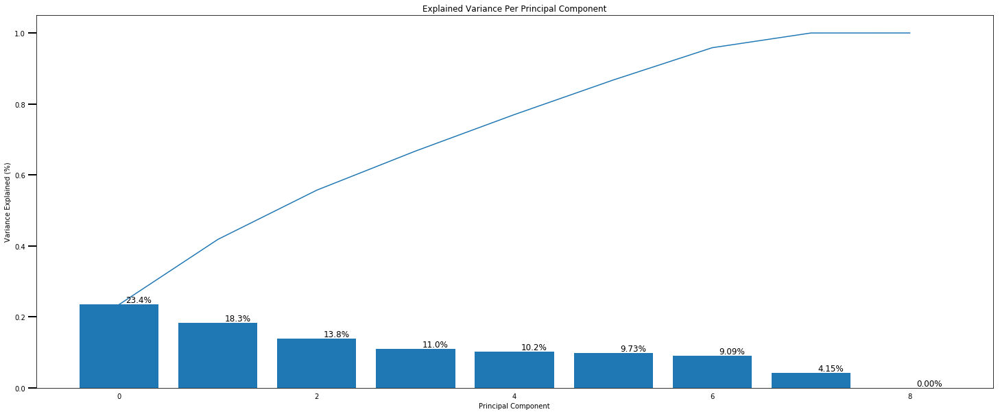

In [33]:
# Apply PCA to the data with for all features
pca = PCA(n_components=9)
pca_scaled_features = pca.fit_transform(scaled_features)
scree_plot(pca)

In [62]:
# Map weights for the first principal component to corresponding feature names
# and then print the linked values, sorted by weight.
def sorted_weights(pca, ix, dataset):
    """
    Docstring- map the weights and components from PCA analysis.
    Input parameters-
    Input - pca initialized model
    ix = index number of first set of components.
    dataset = a dataframe of scaled features
    """
    a1 = pca.components_[ix]
    a2 = dataset.keys().values
    a = list(zip(a1, a2))
    a.sort(key=lambda tup: tup[0])
    return a

In [63]:
sorted_weights(pca,1,df_scaled_features)

[(-0.12229910905176003, 'Type_Free'),
 (-0.006965205700940786, 'Category'),
 (0.052776060545864194, 'Price_in_dollars'),
 (0.12230436804321762, 'Type_Paid'),
 (0.13392012871685735, 'Rating'),
 (0.1488315583383376, 'Content Rating'),
 (0.1913971265965797, 'Size'),
 (0.6631655008104139, 'Installs'),
 (0.6713746849993583, 'Reviews')]

In [36]:
sorted_weights(pca,2,df_scaled_features)

[(-0.5694149133141971, 'Size'),
 (-0.541988498849535, 'Content Rating'),
 (-0.21127969916573552, 'Rating'),
 (-0.028721963191943947, 'Type_Paid'),
 (0.006696511389931445, 'Price_in_dollars'),
 (0.028953514851547082, 'Type_Free'),
 (0.15393357631104168, 'Reviews'),
 (0.1884289484379903, 'Installs'),
 (0.5258011956515887, 'Category')]

In [37]:
sorted_weights(pca,3,df_scaled_features)

[(-0.8812904230194594, 'Rating'),
 (-0.09345087354370417, 'Category'),
 (-0.03562384899857902, 'Type_Paid'),
 (0.03558474197893066, 'Type_Free'),
 (0.03804603155380957, 'Reviews'),
 (0.052252220680459364, 'Installs'),
 (0.058975573719736885, 'Size'),
 (0.2285083375432296, 'Content Rating'),
 (0.3901112896899358, 'Price_in_dollars')]

# PCA Analysis results-
NOTE - 

    PCA analysis shows that 8 components have variance between 23.4% to 4.15% which would affect the prediction of outcomes.
    
    As thumb rule, positive or negative variance of component above 0.5 is deemed to affect the preduction. Hence in first set of features selection, Reviews and Installation numbers play a big role in predicting which category of apps would recieve reviews and higher number of installations.
    
    In the second set of components, Category, Installs, Size and Content Rating variance is inverserly proportional. It implies that Size of App and number of installs are dependent and customers prefer to install low size apps.
    
    
    Third set of components shows App Price and ratings have strong inverse relationship. Customer who pay who provide higher Ratings install apps which are cheaper.

# KMeans clustering Analysis

    KMean clustering of dataset shows that there are three clusters of data in majority. I have used KMeans clustering to separate clusters of data within the dataset based on PCA analysis but it seems that the data is not clearly separable and hands around 3 major clusters.

In [38]:
def plot_data(data, labels):
    '''
    Plot data with colors associated with labels
    '''
    fig = plt.figure();
    ax = Axes3D(fig)
    ax.scatter(data[:, 0], data[:, 1], data[:, 2], c=labels, cmap='tab10');

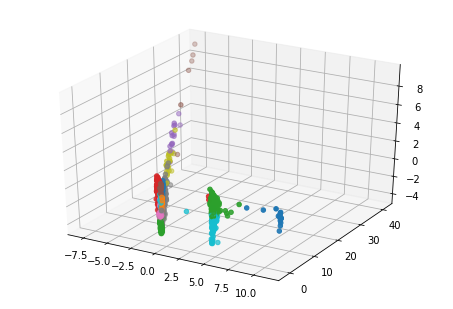

In [39]:
#Evaluate unsupervised learning methods on the data with 8 clusters.
#Initiate KMeans and plot possible clusters
kmeans_pop = KMeans(n_clusters=15)
model_pop = kmeans_pop.fit(pca_scaled_features)
labels_pop = model_pop.predict(pca_scaled_features)
plot_data(pca_scaled_features,labels_pop)

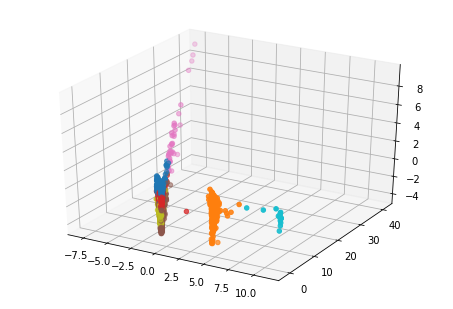

In [40]:
#Evaluate unsupervised learning methods on the data with 8 clusters.
#Initiate KMeans and plot possible clusters
kmeans_pop = KMeans(n_clusters=7)
model_pop = kmeans_pop.fit(pca_scaled_features)
labels_pop = model_pop.predict(pca_scaled_features)
plot_data(pca_scaled_features,labels_pop)

In [41]:
df_playstore_temp.head()

,Category,Rating,Reviews,Size,Installs,Price_in_dollars,Content Rating,Type_Free,Type_Paid
0,0,4.1,159,19.0,10000,0.0,1,1,0
1,0,3.9,967,14.0,500000,0.0,1,1,0
2,0,4.7,87510,8.7,5000000,0.0,1,1,0
3,0,4.5,215644,25.0,50000000,0.0,4,1,0
4,0,4.3,967,2.8,100000,0.0,1,1,0


# Modelling

    Use Linear Regression model to predict the following business questions-
    1. Predict Ratings of apps for all categories.
    2. Predict Pricing of apps.
    3. Predict pricing in relation to number of installations

    Case One- Target Label = 'Rating'

In [42]:
#Split the dataset into features and target labels. Rating column is the target label.
Target_label = df_playstore_temp['Rating']
features_label = df_playstore_temp.drop('Rating',axis=1)

# Split the features into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features_label,Target_label,test_size = 0.2,random_state = 0)

# Show the results of the split
print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

#Train using LinearRegression model
lm_model = LinearRegression(normalize=True)

# If our model works, it should just fit our model to the data. Otherwise, it will let us know.
try:
    lm_model.fit(X_train, y_train)
except:
    print("Oh no! It doesn't work!!!")
    

y_test_preds = lm_model.predict(X_test)# Predictions here
r2_test = r2_score(y_test, y_test_preds) # Rsquared here

# Print r2 to see result
print('R Squared value of the predicted labels: ' + str(r2_test))
coefficients = list(zip(lm_model.coef_,X_test))
#print(coefficients)
print ('Mean Squared Error: '+ str(metrics.mean_squared_error(y_test,y_test_preds)))
print ('Mean absolute Error: '+ str(metrics.mean_absolute_error(y_test,y_test_preds)))
print ('Mean squared Log Error: '+ str(metrics.mean_squared_log_error(y_test,y_test_preds)))


Training set has 7727 samples.
Testing set has 1932 samples.
R Squared value of the predicted labels: 0.012492315518284114
Mean Squared Error: 0.24072991323851956
Mean absolute Error: 0.32423723909300156
Mean squared Log Error: 0.011939118948726549


In [43]:
# Linear regression coefficients for Ratings as target labels.
coefficients

[(-0.0018024997071665536, 'Category'),
 (1.3819674820377472e-08, 'Reviews'),
 (0.0010433895070699137, 'Size'),
 (1.0710294006119369e-10, 'Installs'),
 (-0.0007893641940442483, 'Price_in_dollars'),
 (0.004981703040734751, 'Content Rating'),
 (0.0015468752266353989, 'Type_Free'),
 (0.08451990649932442, 'Type_Paid')]

No handles with labels found to put in legend.


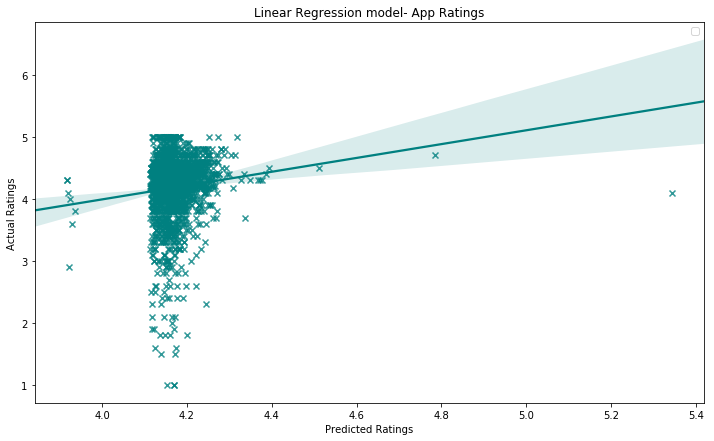

In [44]:
# Plot a chart for linear regression
plt.figure(figsize=(12,7))
sns.regplot(y_test_preds,y_test,color='teal',marker = 'x')
#sns.regplot(y_test_preds1,y_test1,color='orange')
plt.legend()
plt.title('Linear Regression model- App Ratings')
plt.xlabel('Predicted Ratings')
plt.ylabel('Actual Ratings')
plt.show()

    Case Two- Target Label = 'Price_in_dollars'

In [45]:
#Split the dataset into features and target labels. Rating column is the target label.
Target_label1 = df_scaled_features['Price_in_dollars']
features_label1 = df_scaled_features.drop('Price_in_dollars',axis=1)

# Split the features into training and testing sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(features_label1,Target_label1,test_size = 0.2,random_state = 0)

# Show the results of the split
print("Training set has {} samples.".format(X_train1.shape[0]))
print("Testing set has {} samples.".format(X_test1.shape[0]))

#Train using LinearRegression model
lm_model1 = LinearRegression(normalize=True)

# If our model works, it should just fit our model to the data. Otherwise, it will let us know.
try:
    lm_model1.fit(X_train1, y_train1)
except:
    print("Oh no! It doesn't work!!!")
    

y_test_preds1 = lm_model1.predict(X_test1)# Predictions here
r2_test1 = r2_score(y_test1, y_test_preds1) # Rsquared here

# Print r2 to see result
coefficients1 = list(zip(lm_model1.coef_,X_test1))
print('R Squared value of the predicted labels: ' + str(r2_test1))
print ('Mean Squared Error: '+ str(metrics.mean_squared_error(y_test1,y_test_preds1)))
print ('Mean absolute Error: '+ str(metrics.mean_absolute_error(y_test1,y_test_preds1)))
#print ('Mean squared Log Error: '+ str(metrics.mean_squared_log_error(y_test1,y_test_preds1)))


Training set has 7727 samples.
Testing set has 1932 samples.
R Squared value of the predicted labels: 0.051591060661092536
Mean Squared Error: 1.9064629909990272
Mean absolute Error: 0.13830683321673282


In [46]:
# Linear regression coefficients for Price as target labels.
coefficients1

[(-0.011946421241898689, 'Category'),
 (-0.019292765896548807, 'Rating'),
 (0.001969853668919766, 'Reviews'),
 (-0.012532837632746823, 'Size'),
 (0.0006992635413939693, 'Installs'),
 (0.0006528848275836025, 'Content Rating'),
 (0.0021467979800262327, 'Type_Free'),
 (0.19030847314185675, 'Type_Paid')]

No handles with labels found to put in legend.


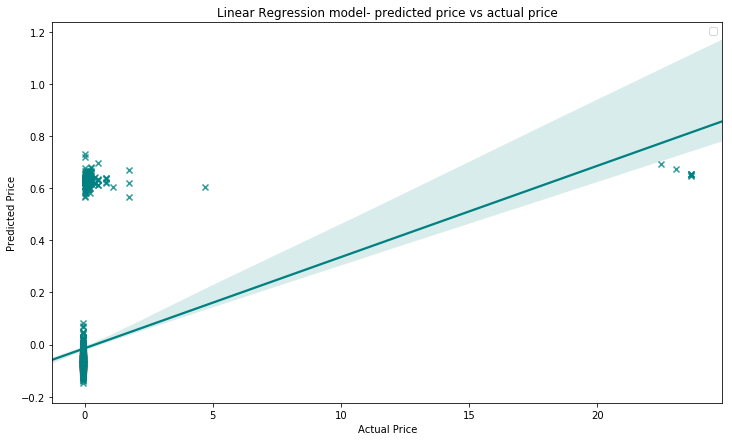

In [47]:
# Plot a chart for linear regression
plt.figure(figsize=(12,7))
#sns.regplot(y_test_preds,y_test,color='teal',marker = 'x')
#sns.regplot(y_test_preds1,y_test1,color='orange')
sns.regplot(y_test1,y_test_preds1,color='teal',marker='x')
plt.legend()
plt.title('Linear Regression model- predicted price vs actual price')
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.show()

    Case Three- Target Label = 'Installs'

In [48]:
#Split the dataset into features and target labels.'Installs'column is the target label.
Target_label2 = df_scaled_features['Installs']
features_label2 = df_scaled_features.drop('Installs',axis=1)

# Split the features into training and testing sets
X_train2, X_test2, y_train2, y_test2 = train_test_split(features_label2,Target_label2,test_size = 0.2,random_state = 0)

# Show the results of the split
print("Training set has {} samples.".format(X_train2.shape[0]))
print("Testing set has {} samples.".format(X_test2.shape[0]))

#Train using LinearRegression model
lm_model2 = LinearRegression(normalize=True)

# If our model works, it should just fit our model to the data. Otherwise, it will let us know.
try:
    lm_model2.fit(X_train2, y_train2)
except:
    print("Oh no! It doesn't work!!!")
    
#Predict function
y_test_preds2 = lm_model2.predict(X_test2)# Predictions here
#R square function
r2_test2 = r2_score(y_test2, y_test_preds2) # Rsquared here

# Print r2 to see result
coefficients2 = list(zip(lm_model2.coef_,X_test2))
print('R Squared value of the predicted labels: ' + str(r2_test2))
print ('Mean Squared Error: '+ str(metrics.mean_squared_error(y_test2,y_test_preds2)))
print ('Mean absolute Error: '+ str(metrics.mean_absolute_error(y_test2,y_test_preds2)))
#print ('Mean squared Log Error: '+ str(metrics.mean_squared_log_error(y_test2,y_test_preds2)))


Training set has 7727 samples.
Testing set has 1932 samples.
R Squared value of the predicted labels: 0.43554084271547755
Mean Squared Error: 0.4897947759940874
Mean absolute Error: 0.1285100215661726


In [49]:
coefficients2

[(0.025157112715526838, 'Category'),
 (0.0075126277466649296, 'Rating'),
 (0.6627852226270038, 'Reviews'),
 (-0.0013543417036387094, 'Size'),
 (0.0006291066872166958, 'Price_in_dollars'),
 (0.013286188837415875, 'Content Rating'),
 (0.01776075161244003, 'Type_Free'),
 (-0.003395519959783328, 'Type_Paid')]

No handles with labels found to put in legend.


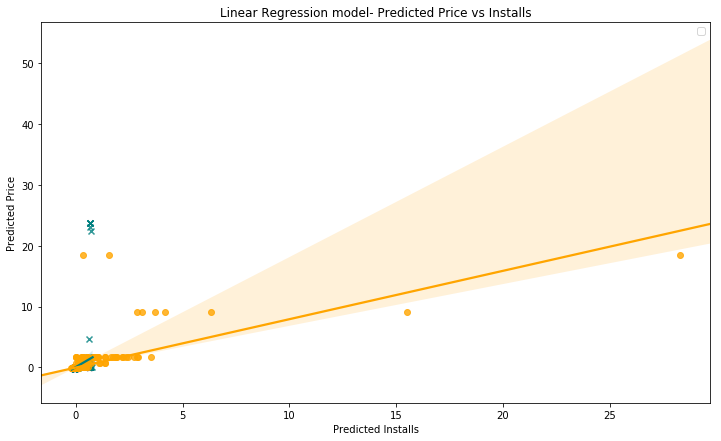

In [50]:
# Plot a chart for linear regression
plt.figure(figsize=(12,7))
sns.regplot(y_test_preds1,y_test1,color='teal',marker = 'x')
sns.regplot(y_test_preds2,y_test2,color='orange')
plt.legend()
plt.title('Linear Regression model- Predicted Price vs Installs')
plt.xlabel('Predicted Installs')
plt.ylabel('Predicted Price')
plt.show()

# Evaluation and Analysis of results

    Evaluate the mean squared error MSE- 
        Case One- Target Label = 'Rating' (1.3819674820377472e-08, 'Reviews'), (1.0710294006119369e-10,'Installs')
        with 'Rating' as target label, model has predicted with much higher coefficients of Reviews and Installs clearly because of high biases which does not show a correct picture.Category values should have been weighed higher -  (-0.0018024997071665536, 'Category'). To me this looks like a misprediction due to biased values.
    
    
    Case Two- Target Label = 'Price_in_dollars' - Mean Squared Error: 1.9064629909990272, MSE is not closer to 0 and highest in comparision to other target labels but the coefficients are equally distributed and it seems that there is no bias introduced during prediction. With maximum value of coefficient (0.19030847314185675, 'Type_Paid'), Linear Regression defines Price has an important feature for App selection. Which sould rational too.
    
    
    Case Three- Target Label = 'Installs' - Mean Squared Error: 0.4897947759940874, MSE is close to Zero which is a good sign and coefficients have correctly identified the weights of features as (0.6627852226270038, 'Reviews')(0.025157112715526838, 'Category'). This shows that Linear Regression model could predict success of an App better if the target label is set to Installs.
    
    It is even interesting to see corelation between predicted price and installs.
    
    Predicted Price vs Predicted Installs

    Linear Regression model shows that predicted price and number of installs are proportional and tends to increase together. (Small Blue line is predicted price and the large Orange line is predicted Installs).   Form Violin plot at the end it would be clear that for certain categories of Apps on playstore, consumers pay for the App.
    
    
    
    "An MSE of zero, meaning that the estimator predicts observations of the parameter with perfect accuracy, is the ideal, but is typically not possible."
        
    Reference link- https://en.wikipedia.org/wiki/Mean_squared_error

# Data Analysis - App pricing distribution trend across categories


    Apps in cateogories like Events, lifestyle, Games, Books and libraries have free to highest prices. Whereas Books and references, Dating, Finance, Health and Fitness, Gaming, Family, Medical apps have lower prices.

    Apps in categories like Game, Lifestyle, Family, Medical, Travel and local, productivity, Health and fitness get paid for with higher number of installations.

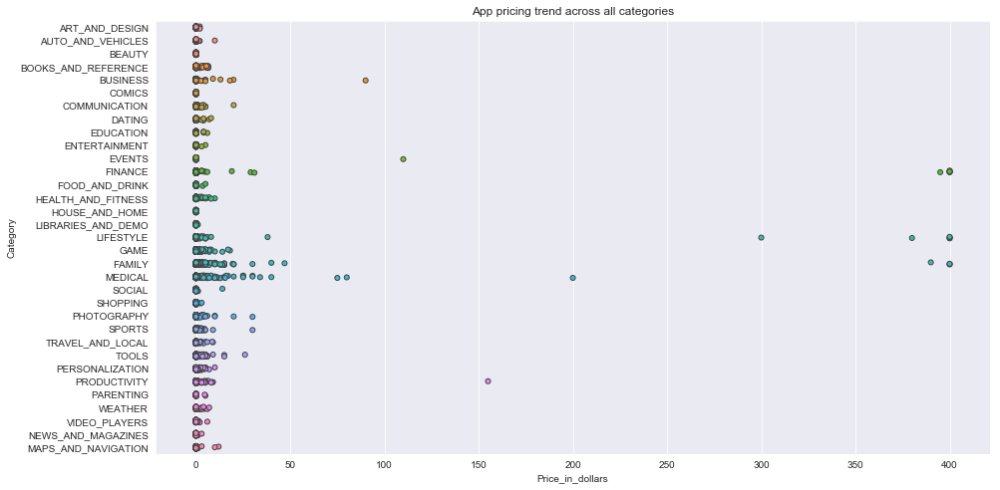

In [51]:
subset_df = df_playstore[df_playstore.Category.isin(df_playstore['Category'].unique())]
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Price_in_dollars", y="Category", data=subset_df, jitter=True, linewidth=1)
title = ax.set_title('App pricing trend across all categories')

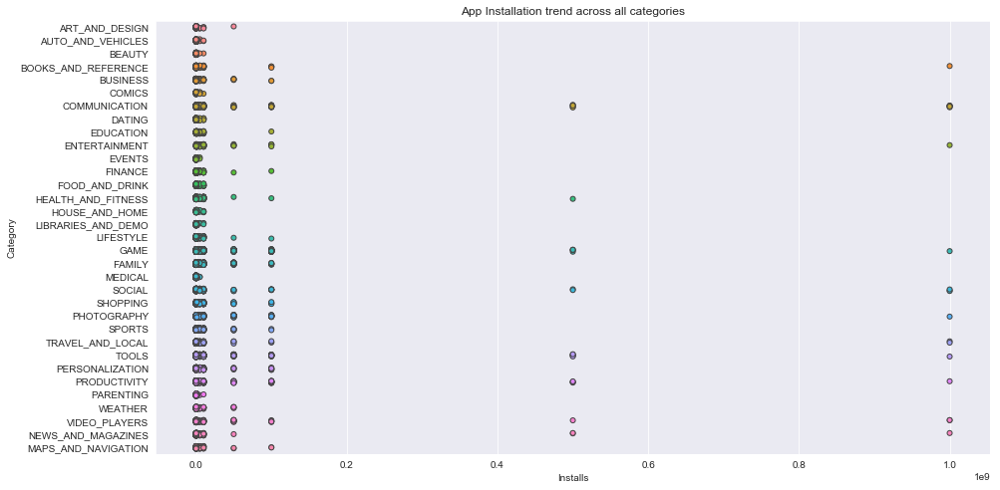

In [52]:
subset_df = df_playstore[df_playstore.Category.isin(df_playstore['Category'].unique())]
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Installs", y="Category", data=subset_df, jitter=True, linewidth=1)
title = ax.set_title('App Installation trend across all categories')

# Corelation between features of App store data

Reviews and Installs have strong corelation which is rational in the given dataset.

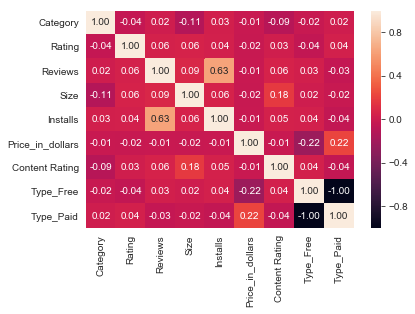

In [53]:
#Corelation plot for numerical encoded version of playstore data.
sns.heatmap(df_playstore_temp.corr(),annot=True,fmt='.2f')

Histogram for scaled and numerical version Playstore dataset.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000017C62BAC908>,
      dtype=object)

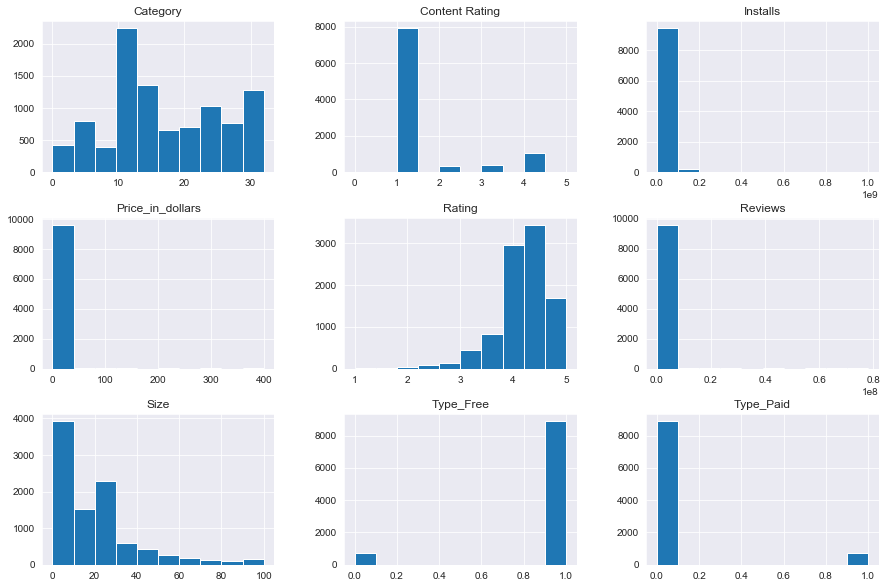

In [54]:
df_playstore_temp.hist(figsize=(15,10))

# Free Or Paid Apps vs Rating

Apps which are paid for have got better rating and more number of Installs.

In [55]:
#function with docstring to plot comparision charts between various features of dataset 
def func_plotjoint(a,b,color='g'):
    """Function to plot seaborn jointplot chart
    Input parameters - 
    x= x-axis labels with dataframe column
    y = y-axis labels with dataframe column
    color = 'r' for red, 'c' for cyan, default is green
    """
    sns.jointplot(x=a,y=b,color=color)

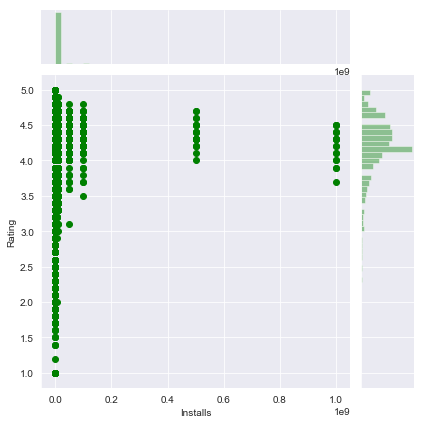

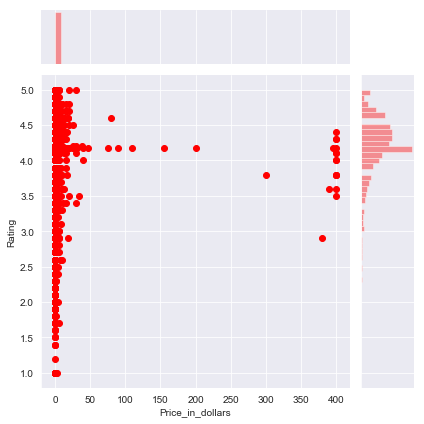

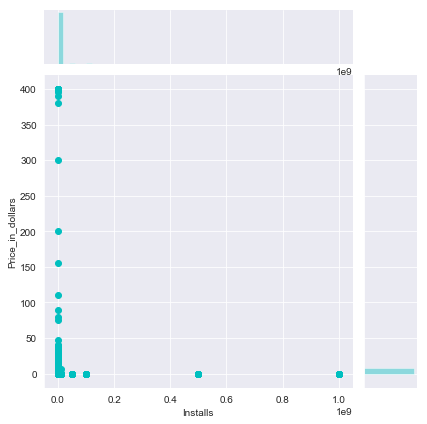

In [56]:
#Plot charts between different important features from modelling and PCA analysis. 
func_plotjoint(df_playstore['Installs'],df_playstore['Rating'])
func_plotjoint(df_playstore['Price_in_dollars'],df_playstore['Rating'],color='r')
func_plotjoint(df_playstore['Installs'],df_playstore['Price_in_dollars'],color='c')

In [57]:
groups = df_playstore.groupby('Category').filter(lambda x: len(x) >= 50).reset_index()
print('Average rating = ', np.nanmean(list(groups.Rating)))

c = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 720, len(set(groups.Category)))]

layout = {'title' : 'App rating distribution and probability density for all categories',
        'xaxis': {'tickangle':-40},
        'yaxis': {'title': 'Rating'},
          'plot_bgcolor': 'rgb(250,250,250)',
          'shapes': [{
              'type' :'line',
              'x0': -.5,
              'y0': np.nanmean(list(groups.Rating)),
              'x1': 19,
              'y1': np.nanmean(list(groups.Rating)),
              'line': { 'dash': 'dashdot'}
          }]
          }

data = [{
    'y': df_playstore.loc[df_playstore.Category==category]['Rating'],
    'type':'violin',
    'name' : category,
    'showlegend':False,
    #'marker': {'color': 'Set2'},
    } for i,category in enumerate(list(set(groups.Category)))]


from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
plotly.offline.iplot({'data': data, 'layout': layout})

Average rating =  4.173243045387995


Average rating for all App Categories

This chart shows median value of Ratings per Category together with Max Rating received and minimum Rating.
This chart also shows combination of ratings distribution and probability density per category.

Tools, Productivity, Finance,   Category- has range of ratings from 1 to 5 

Assuming that Rating is equivalent to popularity, and width and length of curved area of the graph implies that Comics, Health & Fitness,Parenting, Art and Design, 

Reference-
https://en.wikipedia.org/wiki/Violin_plot
https://en.wikipedia.org/wiki/Kernel_density_estimation
http://seaborn.pydata.org/generated/seaborn.violinplot.html

In [58]:
groups = df_playstore.groupby('Category').filter(lambda x: len(x) >= 300).reset_index()
print('Average rating = ', np.nanmean(list(groups.Price_in_dollars)))

c = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 720, len(set(groups.Category)))]

layout = {'title' : 'App Price distribution and probability density for top 10 categories',
        'xaxis': {'tickangle':-40},
        'yaxis': {'title': 'Price_in_dollars'},
          'plot_bgcolor': 'rgb(250,250,250)',
          'shapes': [{
              'type' :'line',
              'x0': -.5,
              'y0': np.nanmean(list(groups.Price_in_dollars)),
              'x1': 19,
              'y1': np.nanmean(list(groups.Price_in_dollars)),
              'line': { 'dash': 'dashdot'}
          }]
          }

data = [{
    'y': df_playstore.loc[df_playstore.Category==category]['Price_in_dollars'],
    'type':'violin',
    'name' : category,
    'showlegend':False,
    #'marker': {'color': 'Set2'},
    } for i,category in enumerate(list(set(groups.Category)))]


from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
plotly.offline.iplot({'data': data, 'layout': layout})

Average rating =  1.5249594615266941


# User Review Data

    Define-
        1. What do users think about the Apps? Keywords?
        2. Sentiment Analysis.

In [59]:
df_reviews.head()

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000


    A wordcloud of most frequently used words used in User reviews by the users.

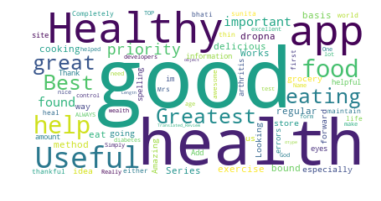

<Figure size 2880x2160 with 0 Axes>

In [60]:
df_reviews['Translated_Review'].replace(np.NaN,'',inplace=True)
review = np.array(df_reviews['Translated_Review'].dropna)

# Create and generate a word cloud image for first 50 dog names:
wordcloud = WordCloud(max_words=100, background_color='white').generate(str(review))

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.figure(figsize=(40,30))
plt.show()

    A wordcloud of most frequently used words used for App names.

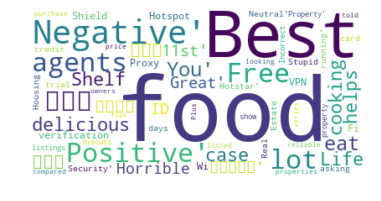

<Figure size 2880x2160 with 0 Axes>

In [61]:
df_reviews['App'].replace(np.NaN,'',inplace=True)
Appname = np.array(df_reviews.drop_duplicates('App').dropna())
# Create and generate a word cloud image for first 50 dog names:
wordcloud = WordCloud(max_words=200, background_color='white').generate(str(Appname))

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.figure(figsize=(40,30))
plt.show()